In [1]:
import keras
from keras.models import Sequential
from keras_preprocessing.image import ImageDataGenerator
from keras.layers import Input,Conv2D,Dense,Dropout,Flatten,MaxPooling2D,AveragePooling2D,Activation,BatchNormalization,GlobalAveragePooling2D
import pandas as pd
import numpy as np
import os
from sklearn.utils import shuffle
import seaborn as sns
import matplotlib.pyplot as plt
from glob import glob
from skimage.io import imread


Using TensorFlow backend.


In [1]:
pip install nbconvert

Note: you may need to restart the kernel to use updated packages.


### ***Загрузка и работа с тренировочными данными. Отображение результатов предсказания и класификации кожных заболеваний***

In [2]:
train_path = "ISIC_2019_Training_Input/"
test_path = "ISIC_2019_Test_Input/"
ground_truth_path = "Training_GroundTruth.csv"

In [3]:
df = pd.read_csv(ground_truth_path) #считывание файла
df.head() 

,image,MEL,NV,BCC,AK,BKL,DF,VASC,SCC,UNK
0,ISIC_0000000,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,ISIC_0000001,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,ISIC_0000002,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,ISIC_0000003,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,ISIC_0000004,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [5]:
columns = list(df.columns)[1:] #вывод всех названий болезней
print(columns)

['MEL', 'NV', 'BCC', 'AK', 'BKL', 'DF', 'VASC', 'SCC', 'UNK']


In [6]:
df_shuffle = shuffle(df,random_state = 7) #вывод случайных строчек 
df_shuffle.head()

,image,MEL,NV,BCC,AK,BKL,DF,VASC,SCC,UNK
23335,ISIC_0070072,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
11567,ISIC_0032970,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
18518,ISIC_0062435,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
17597,ISIC_0060950,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
6468,ISIC_0027871,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [4]:
def show_values_on_bars(axs, h_v, space): #надпись над каждым столбцом
    def _show_on_single_plot(ax):
        for p in ax.patches:
            _x = p.get_x() + p.get_width() / 2
            _y = p.get_y() + p.get_height()+ 100
            value = int(p.get_height())
            ax.text(_x, _y, value, ha="center") 
    if isinstance(axs, np.ndarray):
        for idx, ax in np.ndenumerate(axs):
            _show_on_single_plot(ax)
    else:
        _show_on_single_plot(axs)

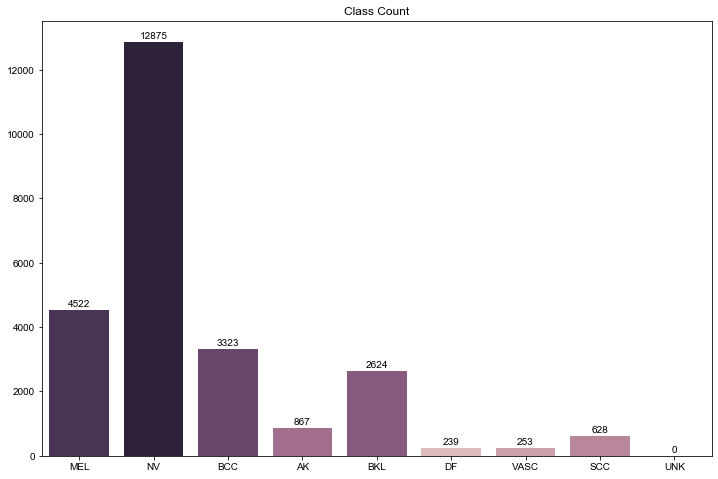

In [7]:
fig = plt.gcf() #обозначене фигуры
fig.set_size_inches(12, 8)#размеры фигуры
plt.title('Class Count')#название диаграммы
data = df[columns].sum() #сумма каждого столбца 
pal = sns.cubehelix_palette(9,reverse = True)#вид цветовой карты
rank = data.values.argsort().argsort()
br = sns.barplot(data.index,data.values,palette=np.array(pal[::-1])[rank]) #построение графика
show_values_on_bars(br, "v", 0.4) 
sns.set()

In [8]:
df['dx'] = df[columns].idxmax(axis=1) #запись диагноза
df.head()

,image,MEL,NV,BCC,AK,BKL,DF,VASC,SCC,UNK,dx
0,ISIC_0000000,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NV
1,ISIC_0000001,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NV
2,ISIC_0000002,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,MEL
3,ISIC_0000003,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NV
4,ISIC_0000004,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,MEL


In [11]:
base_skin_dir = os.path.join('..', 'Diploma')

image_id_path_dict = {os.path.splitext(os.path.basename(x))[0]: x
                     for x in glob(os.path.join(base_skin_dir, '*', '*.jpg'))} #путь к соответствующей фотографии

lesion_type_dict = {
    'NV': 'Melanocytic nevus',
    'MEL': 'Melanoma',
    'BKL': 'Benign keratosis',
    'BCC': 'Basal cell carcinoma',
    'AK': 'Actinic keratosis',
    'VASC': 'Vascular lesion',
    'DF': 'Dermatofibroma',
    'SCC':'Squamous cell carcinoma'
} #список всех диагнозов 

df['path'] = df['image'].map(image_id_path_dict.get) #добавление нового столбца с путем
df['diagnosis'] = df['dx'].map(lesion_type_dict.get) #добавление нового столбца с полным диагнозом
df.head()

,image,MEL,NV,BCC,AK,BKL,DF,VASC,SCC,UNK,dx,path,diagnosis
0,ISIC_0000000,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NV,..\Diploma\ISIC_2019_Training_Input\ISIC_00000...,Melanocytic nevus
1,ISIC_0000001,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NV,..\Diploma\ISIC_2019_Training_Input\ISIC_00000...,Melanocytic nevus
2,ISIC_0000002,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,MEL,..\Diploma\ISIC_2019_Training_Input\ISIC_00000...,Melanoma
3,ISIC_0000003,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NV,..\Diploma\ISIC_2019_Training_Input\ISIC_00000...,Melanocytic nevus
4,ISIC_0000004,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,MEL,..\Diploma\ISIC_2019_Training_Input\ISIC_00000...,Melanoma


### ***Отображение примеров каждого заболевания***

In [12]:
df['image_numb'] = df['path'].map(imread) #загрузка фотографий в файл

In [13]:
df['image_numb'].map(lambda x: x.shape).value_counts()#преобразование изображения в массив чисел
df.head()

,image,MEL,NV,BCC,AK,BKL,DF,VASC,SCC,UNK,dx,path,diagnosis,image_numb
0,ISIC_0000000,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NV,..\Diploma\ISIC_2019_Training_Input\ISIC_00000...,Melanocytic nevus,"[[[251, 255, 255], [232, 241, 248], [243, 255,..."
1,ISIC_0000001,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NV,..\Diploma\ISIC_2019_Training_Input\ISIC_00000...,Melanocytic nevus,"[[[255, 254, 255], [229, 228, 236], [255, 254,..."
2,ISIC_0000002,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,MEL,..\Diploma\ISIC_2019_Training_Input\ISIC_00000...,Melanoma,"[[[255, 255, 255], [239, 239, 239], [255, 255,..."
3,ISIC_0000003,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NV,..\Diploma\ISIC_2019_Training_Input\ISIC_00000...,Melanocytic nevus,"[[[255, 254, 255], [249, 248, 254], [250, 249,..."
4,ISIC_0000004,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,MEL,..\Diploma\ISIC_2019_Training_Input\ISIC_00000...,Melanoma,"[[[255, 255, 255], [244, 244, 244], [255, 255,..."


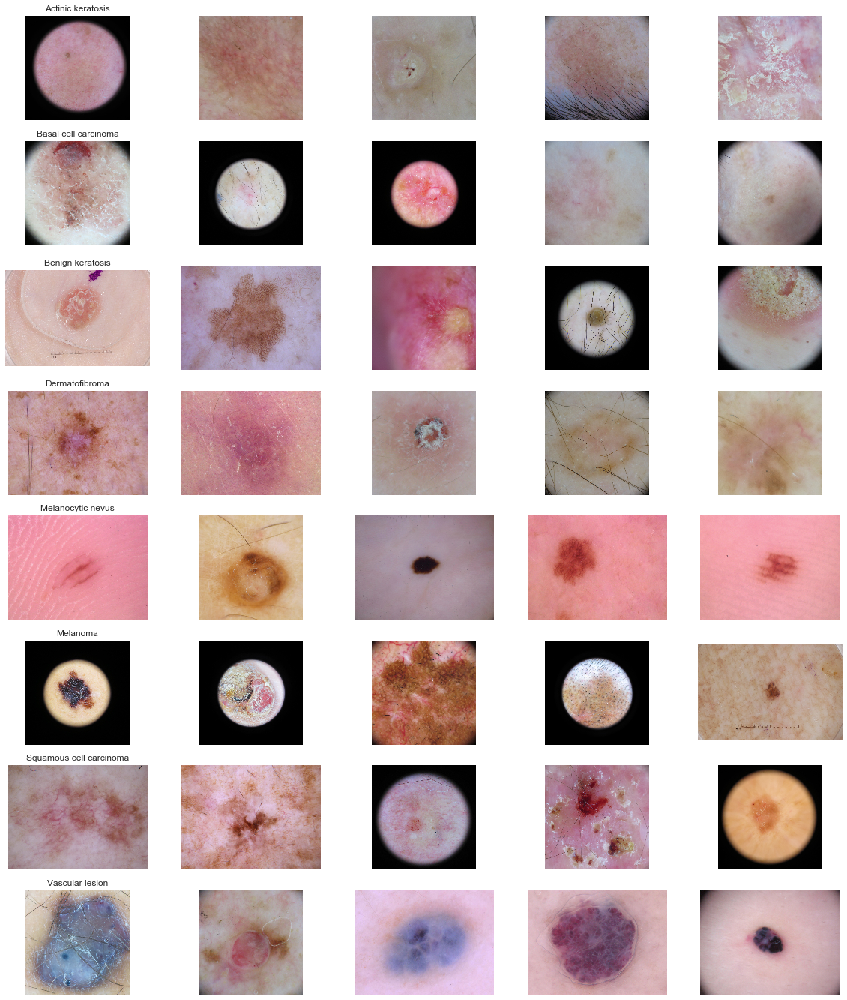

In [14]:
n_samples = 5 #вывод случайных картинок 
fig, m_axs = plt.subplots(8, n_samples, figsize = (4*n_samples, 3*8))
for n_axs, (type_name, type_rows) in zip(m_axs, 
                                         df.sort_values(['diagnosis']).groupby('diagnosis')):
    n_axs[0].set_title(type_name)
    for c_ax, (_, c_row) in zip(n_axs, type_rows.sample(n_samples, random_state=20).iterrows()):
        c_ax.imshow(c_row['image_numb'])
        c_ax.axis('off')
fig.savefig('category_samples.png', dpi=300)

###  ***Достаем и нормализируем информацию о цветовых каналах. Предобладание каждого цвета в каждом изображении***

In [15]:
rgb_info_df = df.apply(lambda x: pd.Series({'{}_mean'.format(k): v for k, v in 
                                  zip(['Red', 'Green', 'Blue'], 
                                      np.mean(x['image_numb'], (0, 1)))}),1) #нормализация данных
gray_col_vec = rgb_info_df.apply(lambda x: np.mean(x), 1)
for c_col in rgb_info_df.columns:
    rgb_info_df[c_col] = rgb_info_df[c_col]/gray_col_vec
rgb_info_df['Gray_mean'] = gray_col_vec
rgb_info_df.sample(3)  #среднее значение цветовых каналов 

,Red_mean,Green_mean,Blue_mean,Gray_mean
20461,1.107220,0.995953,0.896827,59.009044
21276,1.182987,0.956566,0.860447,134.803899
5740,1.144444,0.921368,0.934188,160.149109


In [14]:
for c_col in rgb_info_df.columns:
    df[c_col] = rgb_info_df[c_col].values #копирование значений в таблицу df

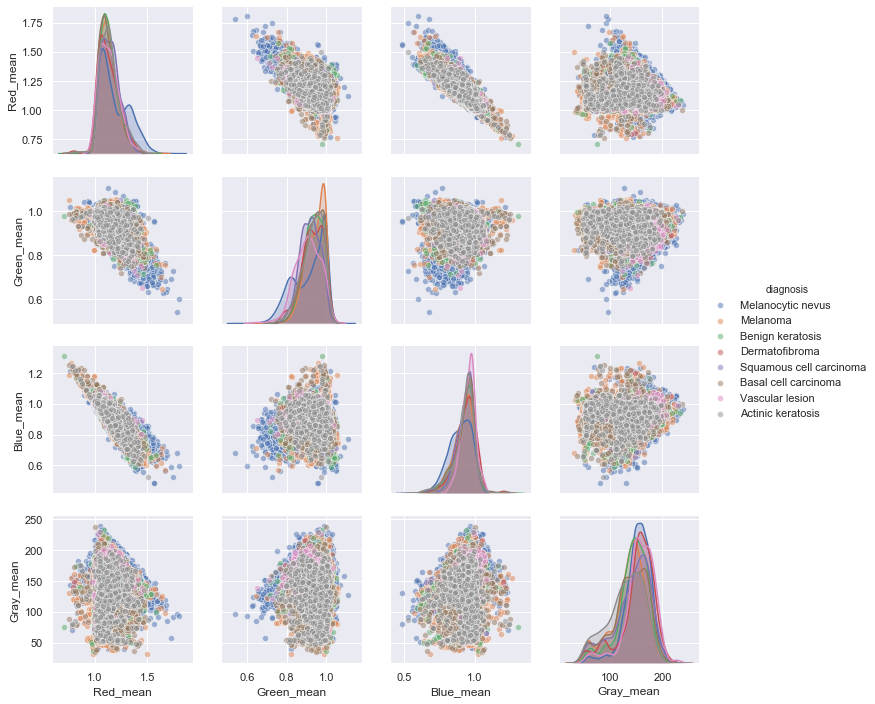

In [15]:
sns.pairplot(df[['Red_mean', 'Green_mean', 'Blue_mean', 'Gray_mean', 'diagnosis']], 
             hue='diagnosis', plot_kws = {'alpha': 0.5}) #график преобладания цвета в конкретном изображениях диагноза

### ***Влияние среднего значения цветового канала(red, green, blue, gray) на изображение***

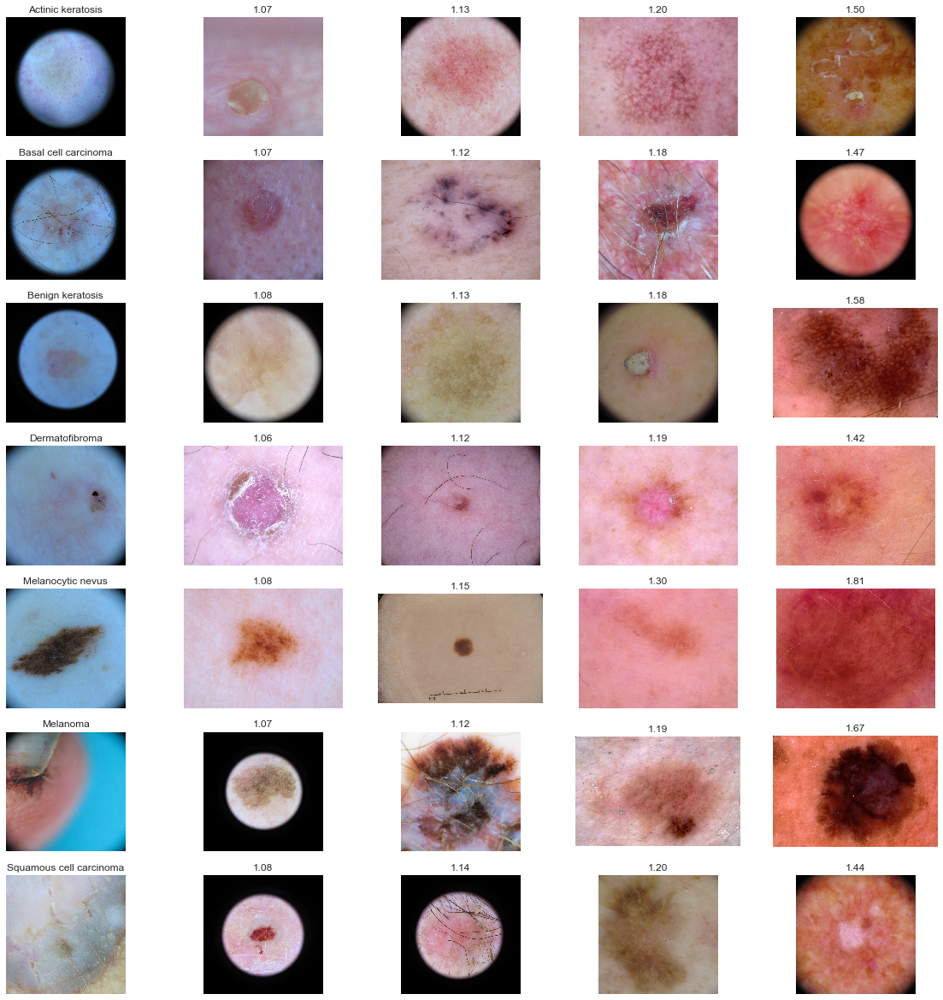

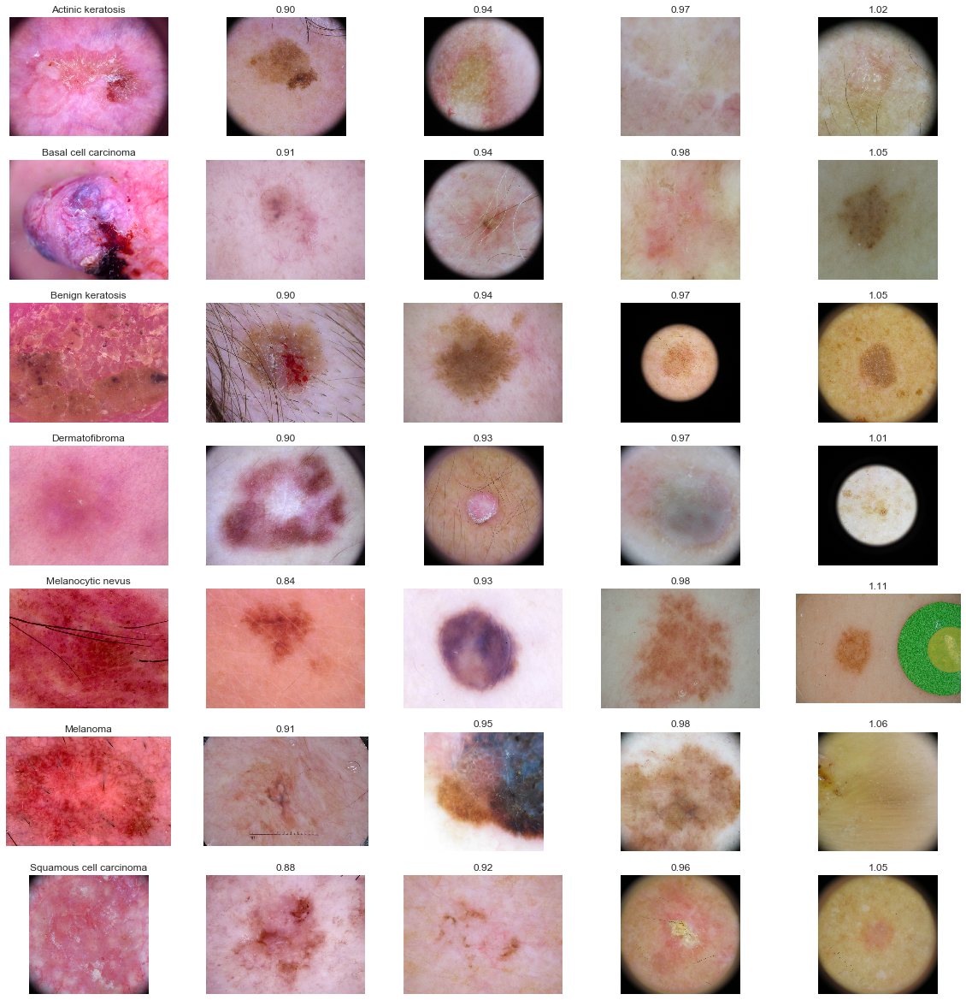

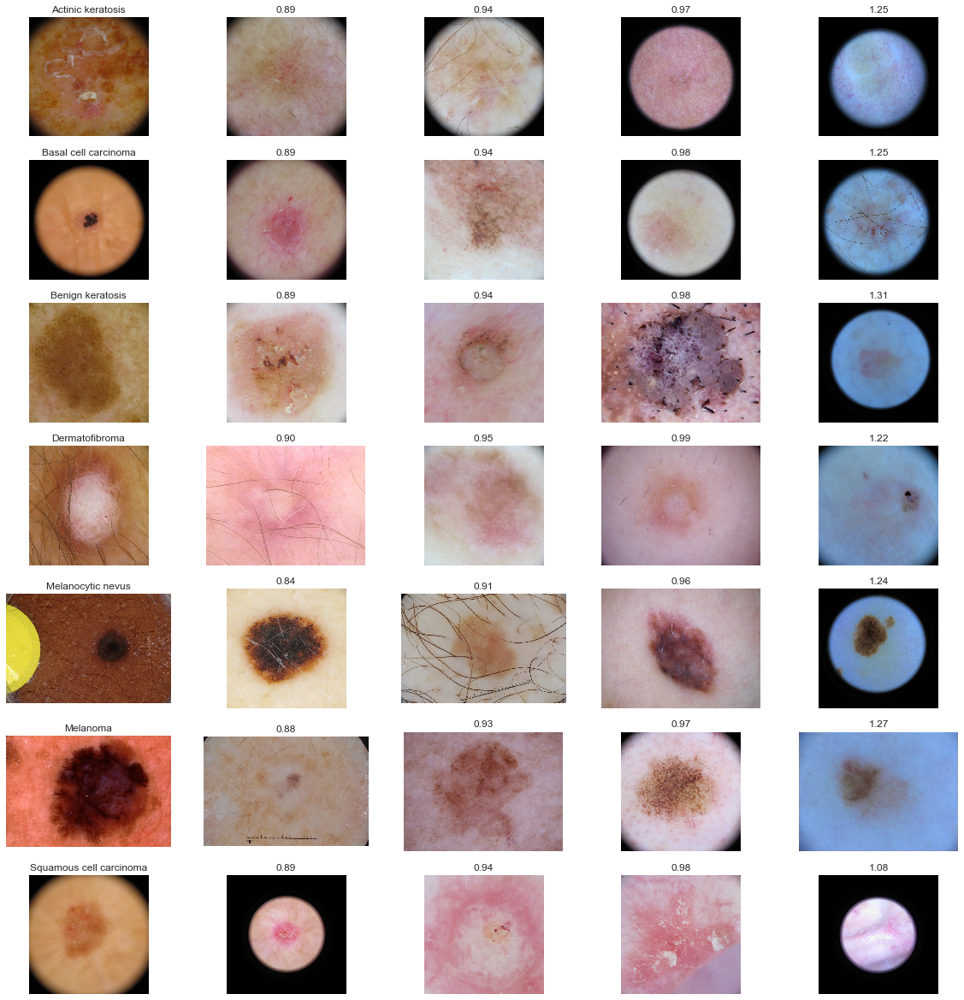

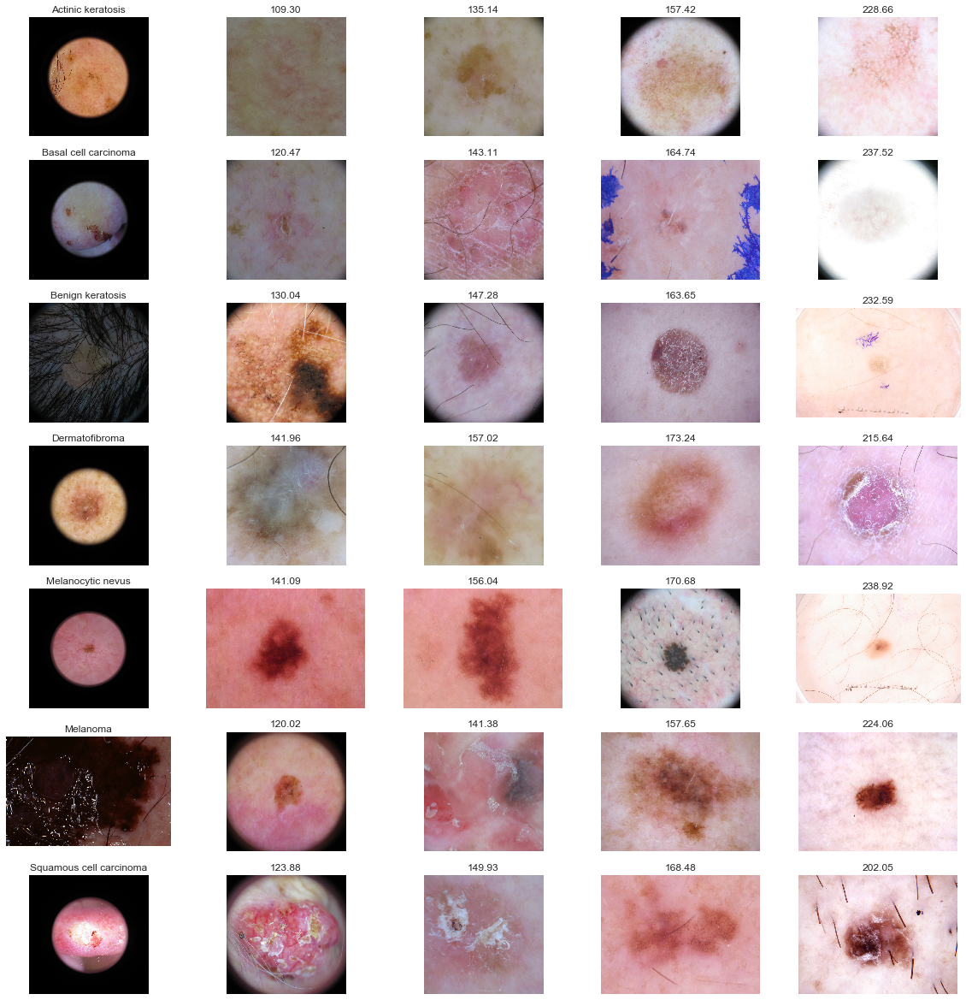

In [16]:
n_samples = 5
for sample_col in ['Red_mean', 'Green_mean', 'Blue_mean', 'Gray_mean']:
    fig, m_axs = plt.subplots(7, n_samples, figsize = (4*n_samples, 3*7))
    def take_n_space(in_rows, val_col, n):
        s_rows = in_rows.sort_values([val_col])
        s_idx = np.linspace(0, s_rows.shape[0]-1, n, dtype=int)
        return s_rows.iloc[s_idx]
    for n_axs, (type_name, type_rows) in zip(m_axs, 
                                             df.sort_values(['diagnosis']).groupby('diagnosis')):

        for c_ax, (_, c_row) in zip(n_axs, 
                                    take_n_space(type_rows, 
                                                 sample_col,
                                                 n_samples).iterrows()):
            c_ax.imshow(c_row['image_numb'])
            c_ax.axis('off')
            c_ax.set_title('{:2.2f}'.format(c_row[sample_col]))
        n_axs[0].set_title(type_name)
    fig.savefig('{}_samples.png'.format(sample_col), dpi=350)

### ***Тренировка нейронной сети*** 

In [17]:
from keras.utils import plot_model
from IPython.display import Image 
plot_model(model,to_file = 'multi_output_model_2.png',show_shapes=True)
pil_img = Image('multi_output_model_2.png')
display(pil_img) #разобраться!

NameError: name 'model' is not defined

In [15]:
def name(row): #добавление .jpg к каждому названию в колонке image
    row.image = row.image + '.jpg'
    return row
#подумать про if-else чтобы не добавлялись лишние .jpg

df = df.apply(name,axis = 1)  #применение функции name к каждой строчке файла
df.head()

,image,MEL,NV,BCC,AK,BKL,DF,VASC,SCC,UNK,dx,path,diagnosis
0,ISIC_0000000.jpg,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NV,..\Diploma\ISIC_2019_Training_Input\ISIC_00000...,Melanocytic nevus
1,ISIC_0000001.jpg,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NV,..\Diploma\ISIC_2019_Training_Input\ISIC_00000...,Melanocytic nevus
2,ISIC_0000002.jpg,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,MEL,..\Diploma\ISIC_2019_Training_Input\ISIC_00000...,Melanoma
3,ISIC_0000003.jpg,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NV,..\Diploma\ISIC_2019_Training_Input\ISIC_00000...,Melanocytic nevus
4,ISIC_0000004.jpg,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,MEL,..\Diploma\ISIC_2019_Training_Input\ISIC_00000...,Melanoma


In [16]:
#создание пакетов данных (шаблонов) тензорного изображения для данных
train_datagen = ImageDataGenerator(rescale=1./255., #масштабирование 
                                  horizontal_flip = True, #переворот по горизонтали
                                  width_shift_range = 0.2, #доля от изображения
                                  height_shift_range = 0.2, 
                                  fill_mode = 'nearest', #режим заполнения aaaaaaaa | abcd | dddddddd
                                  zoom_range = 0.3, #диапазон для случайного увелечения
                                  rotation_range = 30 #диапазон поворота изображения
                                   )
valid_datagen = ImageDataGenerator(rescale=1./255.)

#заполнение тензоров данными
train_generator = train_datagen.flow_from_dataframe(dataframe = df[:25231],
                                              directory = train_path,
                                              x_col = "image",
                                              y_col = columns, #целевые данные 
                                              batch_size = 128, #размер пакета данных 
                                              seed = 42, 
                                              shuffle = True, #перетасовка
                                              class_mode = "raw", 
                                              target_size = (100,100) #размер всех изображений после преобразования 
                                              #validate_filenames = False
                                              )

#If class_mode="multi_output", y_col must be a list. Received Index.
valid_generator = valid_datagen.flow_from_dataframe(dataframe=df[22800:25231],
                                                   directory = train_path,
                                                   x_col= "image",
                                                   y_col=columns,
                                                   batch_size=128,
                                                   seed=42,
                                                   shuffle=True,
                                                   class_mode="raw",
                                                   target_size=(100,100),
                                                   validate_filenames = True
                                                   )

test_generator = valid_datagen.flow_from_dataframe(dataframe=df[25231:],
                                                   directory = train_path,
                                                   x_col="image",
                                                   #y_col=columns,
                                                   batch_size=1,
                                                   seed=42,
                                                   shuffle=True,
                                                   class_mode=None,
                                                   target_size=(100,100),
                                                   validate_filenames = True
                                                   )


Found 25231 validated image filenames.
Found 2431 validated image filenames.
Found 100 validated image filenames.


In [17]:
model = Sequential() #нейронная сеть
model.add(Conv2D(32, (3, 3),input_shape=(100,100,3)))
model.add(BatchNormalization())
model.add(Activation('relu'))

model.add(Conv2D(32, (3, 3)))
model.add(BatchNormalization())
model.add(Activation('relu'))
model.add(Dropout(0.25))

model.add(Conv2D(64, (3, 3)))
model.add(Conv2D(64, (3, 3)))
model.add(Conv2D(64,(3,3)))
model.add(BatchNormalization())
model.add(Activation('relu'))
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Dropout(0.25))

model.add(Conv2D(64,(3,3)))
model.add(Conv2D(64,(3,3)))
model.add(Conv2D(64,(3,3)))
model.add(BatchNormalization())
model.add(Activation('relu'))
model.add(Dropout(0.25))

model.add(Conv2D(128,(3,3)))
model.add(Conv2D(128,(3,3)))
model.add(Conv2D(128,(3,3)))
model.add(BatchNormalization())
model.add(Activation('relu'))
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Dropout(0.5))

model.add(Conv2D(128,(3,3)))
model.add(Conv2D(128,(3,3)))
model.add(Conv2D(128,(3,3)))
model.add(BatchNormalization())
model.add(Activation('relu'))
model.add(Dropout(0.5))

model.add(Conv2D(256,(3,3)))
model.add(Conv2D(256,(3,3)))
model.add(Conv2D(256,(3,3)))
model.add(Conv2D(256,(3,3)))
model.add(BatchNormalization())
model.add(Activation('relu'))
model.add(Dropout(0.5))

model.add(GlobalAveragePooling2D())
#model.add(Flatten())

model.add(Dense(512))
model.add(Activation('relu'))
model.add(Dropout(0.25))

model.add(Dense(1024))
model.add(BatchNormalization())
model.add(Activation('relu'))
model.add(Dropout(0.5))

model.add(Dense(9, activation='sigmoid'))
model.compile(keras.optimizers.rmsprop(lr=0.0001, decay=1e-6),loss="binary_crossentropy",metrics=["accuracy"])

In [ ]:
model.summary() #итоговая модель

In [ ]:
# os.mkdir('History') #создание новой папки
# os.mkdir('Models')

In [18]:
from keras.callbacks import ModelCheckpoint
from keras.models import load_model
from keras.callbacks import *
 
filepath = 'Models/multi_output_model_7_weights-{epoch:02d}-{val_accuracy:.3f}.hdf5' #запись потерь и точности в файлик
checkpoint1 = ModelCheckpoint(filepath, monitor='val_accuracy', verbose=1, save_best_only=True, mode='max')
checkpoint2 = CSVLogger('History/Log_model_7.csv')
callbacks_list = [checkpoint1 , checkpoint2]

In [20]:
STEP_SIZE_TRAIN = train_generator.n//train_generator.batch_size
STEP_SIZE_VALID = valid_generator.n//valid_generator.batch_size
STEP_SIZE_TEST = test_generator.n//test_generator.batch_size
history = model.fit_generator(generator=train_generator,
                              steps_per_epoch=STEP_SIZE_TRAIN,
                              validation_data=valid_generator,
                              validation_steps=STEP_SIZE_VALID,
                              epochs=10,
                              callbacks = callbacks_list
                              )

Epoch 1/10
197/197 [==============================] - 5522s 28s/step - loss: 0.2413 - accuracy: 0.9066 - val_loss: 0.3353 - val_accuracy: 0.8601

Epoch 00001: val_accuracy improved from -inf to 0.86010, saving model to Models/multi_output_model_7_weights-01-0.860.hdf5
Epoch 2/10
197/197 [==============================] - 5063s 26s/step - loss: 0.2212 - accuracy: 0.9137 - val_loss: 0.2884 - val_accuracy: 0.8788

Epoch 00002: val_accuracy improved from 0.86010 to 0.87881, saving model to Models/multi_output_model_7_weights-02-0.879.hdf5
Epoch 3/10
197/197 [==============================] - 5046s 26s/step - loss: 0.2153 - accuracy: 0.9161 - val_loss: 0.2768 - val_accuracy: 0.8974

Epoch 00003: val_accuracy improved from 0.87881 to 0.89738, saving model to Models/multi_output_model_7_weights-03-0.897.hdf5
Epoch 4/10
197/197 [==============================] - 5396s 27s/step - loss: 0.2099 - accuracy: 0.9181 - val_loss: 0.2355 - val_accuracy: 0.9022

Epoch 00004: val_accuracy improved from 0

KeyboardInterrupt: 